# OpenScope Predictive Processing: 60 s calcium-imaging movie + population stimulus-triggered response

This Colab-ready notebook uses the **Mesoscope calcium-imaging Dandiset (DANDI:001768)**. It:

1. selects one NWB asset at random (with a fixed seed for reproducibility),
2. selects one imaging plane,
3. reconstructs a **60-second ROI activity movie** from the plane's ROI masks and ΔF/F traces,
4. overlays stimulus presentation state on the movie,
5. computes stimulus-triggered ΔF/F for **every ROI/neuron in that plane**, and
6. plots the full population-average response (plus neuron × time heatmap).

> **Terminology:** for calcium imaging, the project analysis plan calls this an **event-triggered average (ETA)** rather than a spike PSTH. The final plot is the calcium-imaging analogue of a population PSTH.

> **Important:** the processed Mesoscope NWB stores ROI masks, summary images, and ΔF/F/event traces. Therefore the movie below is a dynamic reconstruction of measured ROI activity over the field of view, not the raw ScanImage pixel movie.

In [ ]:
# Colab setup
!pip -q install "dandi>=0.76" "pynwb>=3.0" "h5py>=3.8" remfile imageio imageio-ffmpeg

In [ ]:
import random, warnings, math
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import Video, display

import h5py, remfile
from dandi.dandiapi import DandiAPIClient
from pynwb import NWBHDF5IO

warnings.filterwarnings("ignore")

DANDISET_ID = "001768"       # OpenScope Predictive Processing - Mesoscope
DANDISET_VERSION = "draft"   # pin to a published version for a frozen analysis
RANDOM_SEED = 27
MOVIE_SECONDS = 60
MOVIE_FPS = 15                # display fps; frames are sampled from the calcium trace
PRE_S = 1.0
POST_S = 2.0
ETA_DT = 0.05                 # 20 Hz interpolation grid
MAX_TRIALS = None             # None = use every valid presentation in chosen table

random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

## 1. Randomly choose a calcium-imaging NWB file from DANDI

The seed makes the “random” choice reproducible. Change `RANDOM_SEED` if you want another sample/session.

In [ ]:
with DandiAPIClient() as client:
    ds = client.get_dandiset(DANDISET_ID, version_id=DANDISET_VERSION)
    assets = [a for a in ds.get_assets() if a.path.lower().endswith(".nwb")]
    if not assets:
        raise RuntimeError("No NWB assets found in DANDI:001768.")
    asset = random.choice(assets)
    asset_path = asset.path
    asset_url = asset.get_content_url(follow_redirects=1, strip_query=True)

print(f"Found {len(assets)} NWB assets")
print("Randomly selected:", asset_path)

Found 86 NWB assets
Randomly selected: sub-850399/sub-850399_ses-multiplane-ophys-850399-2026-05-27-13-34-48_ophys.nwb


## 2. Stream the NWB and inspect imaging planes

Streaming avoids downloading a potentially very large NWB. Keep the `io` object open while accessing lazy HDF5 datasets.

In [ ]:
remote_file = remfile.File(asset_url)
h5_file = h5py.File(remote_file, "r")
io = NWBHDF5IO(file=h5_file, mode="r", load_namespaces=True)
nwb = io.read()

print("session_id:", nwb.session_id)
print("subject:", getattr(nwb.subject, "subject_id", None))
print("processing modules:", list(nwb.processing.keys()))
print("interval tables:", list(nwb.intervals.keys()))

session_id: multiplane-ophys_850399_2026-05-27_13-34-48
subject: 850399
processing modules: ['VISl_4', 'VISl_5', 'VISl_6', 'VISl_7', 'VISp_0', 'VISp_1', 'VISp_2', 'VISp_3', 'eye_tracking', 'running', 'stimulus']
interval tables: ['Control block 1_presentations', 'Control block 2_presentations', 'Control block 3_presentations', 'Control block 4_presentations', 'Duration mismatch block_presentations', 'RF mapping_presentations', 'Zebra_presentations', 'spontaneous_presentations']


In [ ]:
# Identify processing modules that look like Mesoscope planes and contain dF/F.
plane_modules = []
for name, mod in nwb.processing.items():
    keys = list(mod.data_interfaces.keys())
    if "dff_timeseries" in keys and "image_segmentation" in keys:
        plane_modules.append(name)

if not plane_modules:
    raise RuntimeError("Could not find plane modules containing both dff_timeseries and image_segmentation.")

PLANE = random.choice(plane_modules)
mod = nwb.processing[PLANE]
print("Available planes:", plane_modules)
print("Selected plane:", PLANE)
print("Interfaces:", list(mod.data_interfaces.keys()))

Available planes: ['VISl_4', 'VISl_5', 'VISl_6', 'VISl_7', 'VISp_0', 'VISp_1', 'VISp_2', 'VISp_3']
Selected plane: VISp_3
Interfaces: ['dff_timeseries', 'event_timeseries', 'image_segmentation', 'images', 'neuropil_corrected_timeseries', 'neuropil_fluorescence_timeseries', 'raw_timeseries']


## 3. Load ΔF/F, timestamps, ROI masks, and a field-of-view image

The helper functions below tolerate small naming differences across NWB sessions.

In [ ]:
def first_roi_response_series(interface):
    # RoiResponseSeries may be directly exposed or contained in a Fluorescence/DfOverF interface.
    if hasattr(interface, "roi_response_series"):
        vals = list(interface.roi_response_series.values())
        if vals:
            return vals[0]
    if hasattr(interface, "data") and hasattr(interface, "timestamps"):
        return interface
    raise TypeError(f"Cannot locate RoiResponseSeries inside {type(interface).__name__}")


def series_times(series):
    if series.timestamps is not None:
        return np.asarray(series.timestamps[:], dtype=float)
    if series.rate is not None:
        n = series.data.shape[0]
        return float(series.starting_time) + np.arange(n) / float(series.rate)
    raise ValueError("Series has neither timestamps nor rate.")


def orient_time_by_roi(arr, n_times):
    arr = np.asarray(arr)
    if arr.shape[0] == n_times:
        return arr
    if arr.ndim == 2 and arr.shape[1] == n_times:
        return arr.T
    raise ValueError(f"Could not orient array {arr.shape} against {n_times} timestamps")


dff_series = first_roi_response_series(mod["dff_timeseries"])
t = series_times(dff_series)
dff = orient_time_by_roi(dff_series.data[:], len(t)).astype(np.float32)

print("dF/F shape [time, ROI]:", dff.shape)
print("time range:", (t[0], t[-1]))

dF/F shape [time, ROI]: (41515, 256)
time range: (np.float64(32.26095), np.float64(4411.91671))


In [ ]:
# Get the first PlaneSegmentation in this plane module.
imgseg = mod["image_segmentation"]
plane_segs = list(imgseg.plane_segmentations.values())
if not plane_segs:
    raise RuntimeError("No PlaneSegmentation found.")
ps = plane_segs[0]
roi_df = ps.to_dataframe()
print("ROIs in segmentation table:", len(roi_df))
print("ROI columns:", list(roi_df.columns))

# Use NWB pixel masks or image masks to construct a label-like stack of ROI weights.
# Mesoscope images are documented as 512x512; infer dimensions from masks when possible.

pixel_masks = None
image_masks = None

if "pixel_mask" in roi_df.columns:
    pixel_masks = list(roi_df["pixel_mask"])
    if not pixel_masks:
        raise RuntimeError("This PlaneSegmentation exposes pixel_mask column but it's empty.")

    # Determine H and W from pixel_masks if present
    max_x = max(int(np.max(np.asarray(m)[:,0])) for m in pixel_masks if len(m)) if pixel_masks else 0
    max_y = max(int(np.max(np.asarray(m)[:,1])) for m in pixel_masks if len(m)) if pixel_masks else 0
    H, W = max(512, max_y + 1), max(512, max_x + 1)

    n_roi = min(dff.shape[1], len(pixel_masks))
    roi_pixels = []
    for m in pixel_masks[:n_roi]:
        a = np.asarray(m)
        x = a[:,0].astype(int); y = a[:,1].astype(int)
        w = a[:,2].astype(np.float32) if a.shape[1] >= 3 else np.ones(len(a), np.float32)
        keep = (x>=0)&(x<W)&(y>=0)&(y<H)
        roi_pixels.append((y[keep], x[keep], w[keep]))
elif "image_mask" in roi_df.columns:
    image_masks = list(roi_df["image_mask"])
    if not image_masks:
        raise RuntimeError("This PlaneSegmentation exposes image_mask column but it's empty.")

    # Infer H and W from the shape of the first image mask
    # Assuming all image masks have the same shape which corresponds to the full plane.
    first_image_mask_array = np.asarray(image_masks[0])
    H, W = first_image_mask_array.shape
    H, W = max(512, H), max(512, W) # Ensure minimum size is 512x512

    n_roi = min(dff.shape[1], len(image_masks))
    roi_pixels = []
    for i, m in enumerate(image_masks[:n_roi]):
        mask_array = np.asarray(m)
        y_coords, x_coords = np.where(mask_array)
        w_coords = np.ones(len(y_coords), dtype=np.float32)
        # Filter coordinates based on inferred H, W
        keep = (x_coords>=0)&(x_coords<W)&(y_coords>=0)&(y_coords<H)
        roi_pixels.append((y_coords[keep], x_coords[keep], w_coords[keep]))
else:
    raise RuntimeError("This PlaneSegmentation does not expose pixel_mask or image_mask.")

print(f"Using {n_roi} ROIs on inferred canvas {H} x {W}")

ROIs in segmentation table: 256
ROI columns: ['image_mask', 'neuropil_r_value']
Using 256 ROIs on inferred canvas 512 x 512


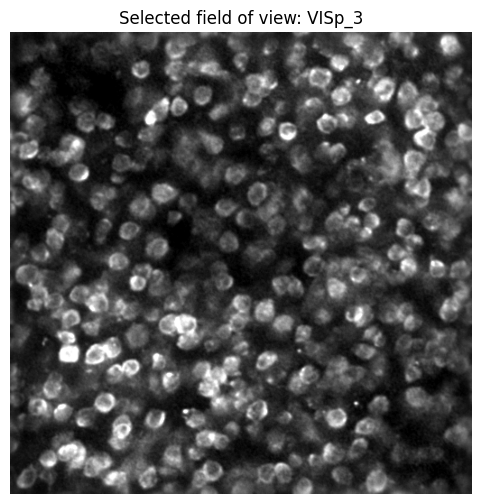

In [ ]:
# Find a summary/background image if available.
bg = np.zeros((H, W), dtype=np.float32)
if "images" in mod.data_interfaces:
    images_iface = mod["images"]
    candidates = []
    if hasattr(images_iface, "images"):
        candidates = list(images_iface.images.values())
    for im in candidates:
        try:
            a = np.asarray(im.data[:], dtype=np.float32).squeeze()
            if a.ndim == 2:
                bg = a
                break
        except Exception:
            pass

lo, hi = np.nanpercentile(bg, [1, 99.5]) if np.any(np.isfinite(bg)) and np.nanmax(bg) > np.nanmin(bg) else (0, 1)
bg_show = np.clip((bg-lo)/(hi-lo+1e-9), 0, 1)

plt.figure(figsize=(6,6))
plt.imshow(bg_show, cmap="gray")
plt.title(f"Selected field of view: {PLANE}")
plt.axis("off")
plt.show()

## 4. Choose a 60-second segment containing stimulus presentations

We prefer a 60 s window beginning at a stimulus onset so the movie shows activity during visual stimulation.

In [ ]:
presentation_tables = [k for k in nwb.intervals.keys() if k.endswith("_presentations") and "spontaneous" not in k.lower()]
if not presentation_tables:
    raise RuntimeError("No *_presentations stimulus interval tables found.")

# Prefer tables with enough rows and valid times inside the dF/F recording.
table_info = []
for name in presentation_tables:
    df = nwb.intervals[name].to_dataframe()
    valid = df[(df.start_time >= t[0]) & (df.start_time <= t[-1])]
    table_info.append((name, len(valid)))
print("Presentation tables:", table_info)

STIM_TABLE = max(table_info, key=lambda x: x[1])[0]
stim = nwb.intervals[STIM_TABLE].to_dataframe().copy()
stim = stim[(stim.start_time >= t[0]) & (stim.start_time <= t[-1])].reset_index(drop=True)
if len(stim) == 0:
    raise RuntimeError("Chosen stimulus table has no presentations inside imaging timestamps.")

movie_start = float(stim.iloc[len(stim)//2].start_time)
movie_start = min(movie_start, float(t[-1] - MOVIE_SECONDS))
movie_start = max(movie_start, float(t[0]))
movie_end = movie_start + MOVIE_SECONDS

print("Stimulus table:", STIM_TABLE)
print(f"Movie window: {movie_start:.3f} to {movie_end:.3f} s")
display(stim[(stim.start_time < movie_end) & (stim.stop_time > movie_start)].head(10))

Presentation tables: [('Control block 1_presentations', 1088), ('Control block 2_presentations', 1120), ('Control block 3_presentations', 368), ('Control block 4_presentations', 11520), ('Duration mismatch block_presentations', 2274), ('RF mapping_presentations', 1215), ('Zebra_presentations', 18000)]
Stimulus table: Zebra_presentations
Movie window: 3786.472 to 3846.472 s


,start_time,stop_time,stim_name,stim_type,stim_block,Orientation,SpatialFrequency,TemporalFrequency,contrast,phase,...,Delay,BlockNumber,BlockLabel,TrialNumber,SequenceNumber,TrialInSequence,TrialType,BlockType,stim_index,timeseries
9000,3786.47218,3786.48879,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,1.0,single,movie,2.0,"[(25369, 1, timestamps pynwb.base.TimeSeries a..."
9001,3786.48879,3786.52216,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,2.0,single,movie,2.0,"[(25370, 1, timestamps pynwb.base.TimeSeries a..."
9002,3786.52216,3786.55547,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,3.0,single,movie,2.0,"[(25371, 1, timestamps pynwb.base.TimeSeries a..."
9003,3786.55547,3786.58880,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,4.0,single,movie,2.0,"[(25372, 1, timestamps pynwb.base.TimeSeries a..."
9004,3786.58880,3786.62221,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,5.0,single,movie,2.0,"[(25373, 1, timestamps pynwb.base.TimeSeries a..."
9005,3786.62221,3786.65550,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,6.0,single,movie,2.0,"[(25374, 1, timestamps pynwb.base.TimeSeries a..."
9006,3786.65550,3786.68890,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,7.0,single,movie,2.0,"[(25375, 1, timestamps pynwb.base.TimeSeries a..."
9007,3786.68890,3786.72214,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,8.0,single,movie,2.0,"[(25376, 1, timestamps pynwb.base.TimeSeries a..."
9008,3786.72214,3786.75542,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,9.0,single,movie,2.0,"[(25377, 1, timestamps pynwb.base.TimeSeries a..."
9009,3786.75542,3786.78885,Zebra,None or Blank,6.0,0.0,0.0,0.0,1.0,0.0,...,0.0,7.0,Zebra,16372.0,0.0,10.0,single,movie,2.0,"[(25378, 1, timestamps pynwb.base.TimeSeries a..."


## 5. Create the 60-second neuron activity movie

Each frame paints each ROI footprint with its ΔF/F at that time. The title reports the current stimulus row when one overlaps the frame time. The MP4 is saved to the Colab working directory.

In [ ]:
# Sample dF/F at display times.
movie_times = np.linspace(movie_start, movie_end, int(MOVIE_SECONDS*MOVIE_FPS), endpoint=False)
frame_idx = np.searchsorted(t, movie_times, side="left")
frame_idx = np.clip(frame_idx, 0, len(t)-1)

# Robust display scale from the selected 60 s window.
vals = dff[frame_idx, :n_roi]
vmin, vmax = np.nanpercentile(vals, [5, 99])
if not np.isfinite(vmin): vmin = 0
if not np.isfinite(vmax) or vmax <= vmin: vmax = vmin + 1

stim_movie = stim[(stim.start_time < movie_end) & (stim.stop_time > movie_start)].copy()

def stimulus_label(now):
    rows = stim_movie[(stim_movie.start_time <= now) & (stim_movie.stop_time >= now)]
    if rows.empty:
        return "inter-stimulus"
    r = rows.iloc[0]
    fields = []
    for col in ["stimulus_name", "trial_type", "orientation", "temporal_frequency", "spatial_frequency"]:
        if col in rows.columns and pd.notna(r[col]):
            fields.append(f"{col}={r[col]}")
    return ", ".join(fields) if fields else STIM_TABLE

fig, ax = plt.subplots(figsize=(6,6))
canvas = np.full((H,W), np.nan, dtype=np.float32)
im = ax.imshow(canvas, cmap="viridis", vmin=vmin, vmax=vmax)
ax.imshow(bg_show, cmap="gray", alpha=0.20)
ax.axis("off")
cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cb.set_label("ROI ΔF/F")

def update(k):
    canvas = np.full((H,W), np.nan, dtype=np.float32)
    activity = dff[frame_idx[k], :n_roi]
    for j, (yy, xx, ww) in enumerate(roi_pixels):
        canvas[yy, xx] = activity[j] * ww
    im.set_data(canvas)
    now = movie_times[k]
    ax.set_title(f"{PLANE} | t={now:.2f}s | {stimulus_label(now)}", fontsize=9)
    return (im,)

ani = animation.FuncAnimation(fig, update, frames=len(movie_times), interval=1000/MOVIE_FPS, blit=False)
out_movie = "openscope_mesoscope_60s_roi_activity.mp4"
ani.save(out_movie, writer=animation.FFMpegWriter(fps=MOVIE_FPS, bitrate=1800), dpi=110)
plt.close(fig)
print("Saved:", out_movie)
display(Video(out_movie, embed=True))

Saved: openscope_mesoscope_60s_roi_activity.mp4


## 6. Full stimulus-triggered response for all neurons

We align every ROI's ΔF/F to all valid onsets in the selected presentation table, interpolate onto a common time grid, average across trials **within each neuron**, then average across **all neurons**. This is the full population calcium ETA/PSTH-style response.

In [ ]:
rel_t = np.arange(-PRE_S, POST_S + ETA_DT/2, ETA_DT)
onsets = stim.start_time.to_numpy(float)
onsets = onsets[(onsets + rel_t[0] >= t[0]) & (onsets + rel_t[-1] <= t[-1])]
if MAX_TRIALS is not None:
    onsets = onsets[:MAX_TRIALS]
if len(onsets) == 0:
    raise RuntimeError("No stimulus onsets have a complete analysis window.")

# Trial accumulation without storing a huge trial x time x neuron tensor.
sum_resp = np.zeros((len(rel_t), n_roi), dtype=np.float64)
count_resp = np.zeros((len(rel_t), n_roi), dtype=np.int64)

for onset in onsets:
    q = onset + rel_t
    # Interpolate each ROI. np.interp is fast and robust for a moderate number of ROIs.
    trial = np.column_stack([np.interp(q, t, dff[:,j]) for j in range(n_roi)])
    good = np.isfinite(trial)
    sum_resp += np.where(good, trial, 0.0)
    count_resp += good

neuron_eta = sum_resp / np.maximum(count_resp, 1)  # [time, neuron]

# Baseline-subtract each neuron using the pre-stimulus period.
baseline_mask = rel_t < 0
baseline = np.nanmean(neuron_eta[baseline_mask], axis=0, keepdims=True)
neuron_eta_bs = neuron_eta - baseline

population_mean = np.nanmean(neuron_eta_bs, axis=1)
population_sem = np.nanstd(neuron_eta_bs, axis=1, ddof=1) / np.sqrt(n_roi)

print(f"Trials: {len(onsets)} | neurons/ROIs: {n_roi} | stimulus table: {STIM_TABLE}")

Trials: 18000 | neurons/ROIs: 256 | stimulus table: Zebra_presentations


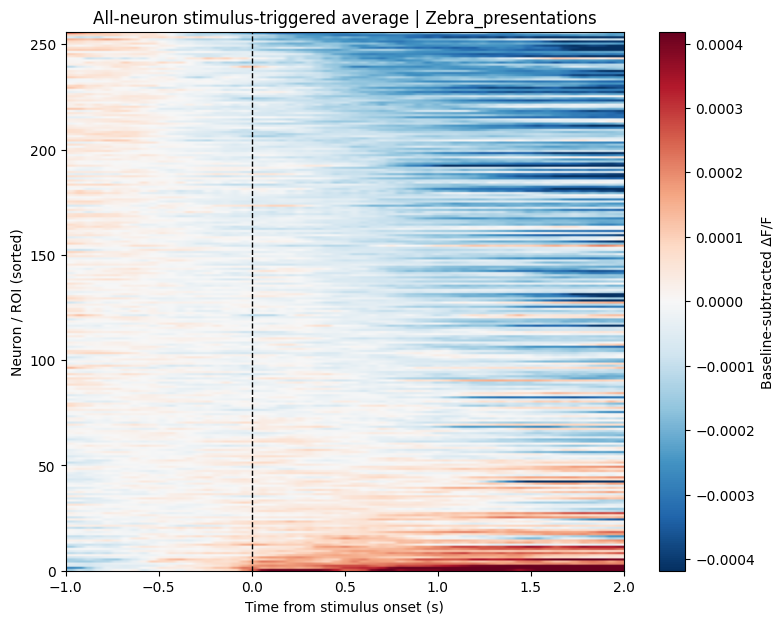

In [ ]:
# Plot every neuron's trial-averaged response as a heatmap.
response_window = (rel_t >= 0) & (rel_t <= min(1.0, POST_S))
order = np.argsort(np.nanmean(neuron_eta_bs[response_window], axis=0))[::-1]

plt.figure(figsize=(9,7))
lim = np.nanpercentile(np.abs(neuron_eta_bs), 99)
plt.imshow(neuron_eta_bs[:, order].T, aspect="auto", origin="lower",
           extent=[rel_t[0], rel_t[-1], 0, n_roi], cmap="RdBu_r", vmin=-lim, vmax=lim)
plt.axvline(0, color="k", linestyle="--", linewidth=1)
plt.colorbar(label="Baseline-subtracted ΔF/F")
plt.xlabel("Time from stimulus onset (s)")
plt.ylabel("Neuron / ROI (sorted)")
plt.title(f"All-neuron stimulus-triggered average | {STIM_TABLE}")
plt.show()

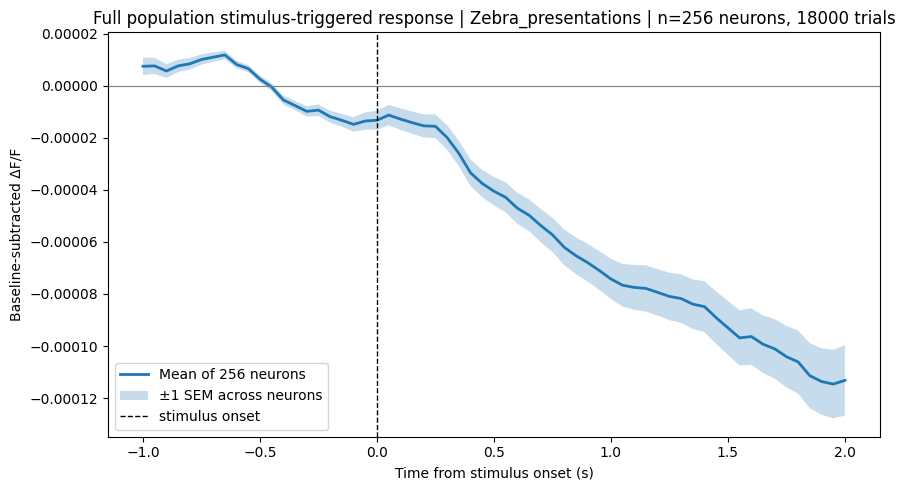

In [ ]:
# Population average across ALL neurons, with SEM across neurons.
plt.figure(figsize=(9,5))
plt.plot(rel_t, population_mean, linewidth=2, label=f"Mean of {n_roi} neurons")
plt.fill_between(rel_t, population_mean-population_sem, population_mean+population_sem, alpha=0.25, label="±1 SEM across neurons")
plt.axvline(0, color="k", linestyle="--", linewidth=1, label="stimulus onset")
plt.axhline(0, color="0.5", linewidth=0.8)
plt.xlabel("Time from stimulus onset (s)")
plt.ylabel("Baseline-subtracted ΔF/F")
plt.title(f"Full population stimulus-triggered response | {STIM_TABLE} | n={n_roi} neurons, {len(onsets)} trials")
plt.legend()
plt.tight_layout()
plt.show()

## 7. Optional: separate population responses by stimulus identity / trial type

If the selected table contains useful categorical columns, this cell plots separate all-neuron averages for the most common values.

In [ ]:
candidate_cols = [c for c in ["trial_type", "stimulus_name", "orientation", "temporal_frequency", "spatial_frequency"] if c in stim.columns]
print("Available grouping columns:", candidate_cols)

if candidate_cols:
    GROUP_BY = candidate_cols[0]
    top_values = stim[GROUP_BY].value_counts(dropna=True).head(8).index
    plt.figure(figsize=(10,5))
    for val in top_values:
        these = stim.loc[stim[GROUP_BY] == val, "start_time"].to_numpy(float)
        these = these[(these + rel_t[0] >= t[0]) & (these + rel_t[-1] <= t[-1])]
        if len(these) == 0:
            continue
        # Average trials, then neurons.
        accum = np.zeros((len(rel_t), n_roi), float)
        for onset in these:
            q = onset + rel_t
            accum += np.column_stack([np.interp(q, t, dff[:,j]) for j in range(n_roi)])
        eta = accum / len(these)
        eta -= np.nanmean(eta[baseline_mask], axis=0, keepdims=True)
        plt.plot(rel_t, np.nanmean(eta, axis=1), label=f"{val} (n={len(these)})")
    plt.axvline(0, color="k", ls="--", lw=1)
    plt.xlabel("Time from stimulus onset (s)")
    plt.ylabel("Population baseline-subtracted ΔF/F")
    plt.title(f"Population ETA grouped by {GROUP_BY}")
    plt.legend(fontsize=8, ncol=2)
    plt.tight_layout()
    plt.show()
else:
    print("No standard categorical stimulus column found; inspect stim.columns and choose one manually.")

Available grouping columns: []
No standard categorical stimulus column found; inspect stim.columns and choose one manually.


## 8. Save analysis outputs

The MP4 is already saved. This cell also exports the all-neuron ETA matrix and population mean as CSV files for downstream analysis or GitHub.

In [ ]:
eta_df = pd.DataFrame(neuron_eta_bs, index=rel_t, columns=[f"roi_{i}" for i in range(n_roi)])
eta_df.index.name = "time_from_stimulus_s"
eta_df.to_csv("all_neuron_stimulus_triggered_eta.csv")

pd.DataFrame({
    "time_from_stimulus_s": rel_t,
    "population_mean_dff": population_mean,
    "population_sem_dff": population_sem,
}).to_csv("population_average_stimulus_triggered_eta.csv", index=False)

print("Saved:")
print(" -", out_movie)
print(" - all_neuron_stimulus_triggered_eta.csv")
print(" - population_average_stimulus_triggered_eta.csv")

Saved:
 - openscope_mesoscope_60s_roi_activity.mp4
 - all_neuron_stimulus_triggered_eta.csv
 - population_average_stimulus_triggered_eta.csv


## Notes for interpretation

- The 60 s movie visualizes **ROI-resolved ΔF/F activity** over the measured cell footprints and labels the current stimulus state.
- The heatmap includes the stimulus-triggered average for **every ROI/neuron** in the selected imaging plane.
- The population trace averages those neuron-level trial averages, so each neuron contributes equally.
- For calcium imaging, this is more accurately called an **ETA** than a spike PSTH.
- For a publication-grade mismatch analysis, choose the specific mismatch and matched-control presentation tables appropriate to the session context rather than pooling every presentation in a table.

Close the streamed file when finished:

In [ ]:
# Run this after all analyses are complete.
io.close()
h5_file.close()
remote_file.close()